In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy import stats
import statsmodels.formula.api as smf

In [2]:
train = pd.read_csv('customer_churn_dataset-training-master.csv')

test = pd.read_csv('customer_churn_dataset-testing-master.csv')

print(train.columns.to_list())
print(test.columns.to_list())

['CustomerID', 'Age', 'Gender', 'Tenure', 'Usage Frequency', 'Support Calls', 'Payment Delay', 'Subscription Type', 'Contract Length', 'Total Spend', 'Last Interaction', 'Churn']
['CustomerID', 'Age', 'Gender', 'Tenure', 'Usage Frequency', 'Support Calls', 'Payment Delay', 'Subscription Type', 'Contract Length', 'Total Spend', 'Last Interaction', 'Churn']


In [3]:
df = pd.concat([train, test], ignore_index=True)

In [4]:
df.head(10)

,CustomerID,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn
0,2.0,30.0,Female,39.0,14.0,5.0,18.0,Standard,Annual,932.0,17.0,1.0
1,3.0,65.0,Female,49.0,1.0,10.0,8.0,Basic,Monthly,557.0,6.0,1.0
2,4.0,55.0,Female,14.0,4.0,6.0,18.0,Basic,Quarterly,185.0,3.0,1.0
3,5.0,58.0,Male,38.0,21.0,7.0,7.0,Standard,Monthly,396.0,29.0,1.0
4,6.0,23.0,Male,32.0,20.0,5.0,8.0,Basic,Monthly,617.0,20.0,1.0
5,8.0,51.0,Male,33.0,25.0,9.0,26.0,Premium,Annual,129.0,8.0,1.0
6,9.0,58.0,Female,49.0,12.0,3.0,16.0,Standard,Quarterly,821.0,24.0,1.0
7,10.0,55.0,Female,37.0,8.0,4.0,15.0,Premium,Annual,445.0,30.0,1.0
8,11.0,39.0,Male,12.0,5.0,7.0,4.0,Standard,Quarterly,969.0,13.0,1.0
9,12.0,64.0,Female,3.0,25.0,2.0,11.0,Standard,Quarterly,415.0,29.0,1.0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 505207 entries, 0 to 505206
Data columns (total 12 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   CustomerID         505206 non-null  float64
 1   Age                505206 non-null  float64
 2   Gender             505206 non-null  object 
 3   Tenure             505206 non-null  float64
 4   Usage Frequency    505206 non-null  float64
 5   Support Calls      505206 non-null  float64
 6   Payment Delay      505206 non-null  float64
 7   Subscription Type  505206 non-null  object 
 8   Contract Length    505206 non-null  object 
 9   Total Spend        505206 non-null  float64
 10  Last Interaction   505206 non-null  float64
 11  Churn              505206 non-null  float64
dtypes: float64(9), object(3)
memory usage: 46.3+ MB


check null values

In [6]:
df.isnull().sum()

CustomerID           1
Age                  1
Gender               1
Tenure               1
Usage Frequency      1
Support Calls        1
Payment Delay        1
Subscription Type    1
Contract Length      1
Total Spend          1
Last Interaction     1
Churn                1
dtype: int64

Remove null values

In [7]:
df.dropna(inplace=True)

confirm null existence of values

In [8]:
df.isnull().sum()

CustomerID           0
Age                  0
Gender               0
Tenure               0
Usage Frequency      0
Support Calls        0
Payment Delay        0
Subscription Type    0
Contract Length      0
Total Spend          0
Last Interaction     0
Churn                0
dtype: int64

check duplicates

In [9]:
df.duplicated().sum()

np.int64(0)

In [10]:
categorical_columns = df.select_dtypes(include='object')

categorical_columns

,Gender,Subscription Type,Contract Length
0,Female,Standard,Annual
1,Female,Basic,Monthly
2,Female,Basic,Quarterly
3,Male,Standard,Monthly
4,Male,Basic,Monthly
...,...,...,...
505202,Female,Basic,Quarterly
505203,Male,Standard,Annual
505204,Male,Premium,Monthly
505205,Female,Standard,Monthly


In [11]:
unique_values = {col:df[col].unique() for col in categorical_columns}
for col, values in unique_values.items():
    print(f'\033[1m{col}\033[0m:{values}\n')

Gender:['Female' 'Male']

Subscription Type:['Standard' 'Basic' 'Premium']

Contract Length:['Annual' 'Monthly' 'Quarterly']



Extract new columns

In [12]:
df['Monthly'] = df['Total Spend'] / 12
df['Quater'] = df['Total Spend'] / 0.25

Statistical Summery

In [13]:
df.describe()

,CustomerID,Age,Tenure,Usage Frequency,Support Calls,Payment Delay,Total Spend,Last Interaction,Churn,Monthly,Quater
count,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000
mean,200779.451782,39.704172,31.350435,15.714825,3.833317,13.496843,620.072766,14.610581,0.555203,51.672730,2480.291063
std,137241.343095,12.670577,17.237482,8.619323,3.133603,8.451187,245.319256,8.608286,0.496944,20.443271,981.277022
min,1.000000,18.000000,1.000000,1.000000,0.000000,0.000000,100.000000,1.000000,0.000000,8.333333,400.000000
25%,63827.250000,29.000000,16.000000,8.000000,1.000000,6.000000,446.000000,7.000000,0.000000,37.166667,1784.000000
50%,193039.500000,40.000000,32.000000,16.000000,3.000000,13.000000,648.900000,14.000000,1.000000,54.075000,2595.600000
75%,321645.750000,49.000000,46.000000,23.000000,6.000000,20.000000,824.000000,22.000000,1.000000,68.666667,3296.000000
max,449999.000000,65.000000,60.000000,30.000000,10.000000,30.000000,1000.000000,30.000000,1.000000,83.333333,4000.000000


Analys the categorical columns

In [14]:
#categorical columns analysis
#Displaying values counts and percentage of categorical columns
for col in categorical_columns:
    print(f'\nColumns:\033[1m{col}\033[0m')
    print(df[col].value_counts(normalize=True).mul(100).round(2).astype(str)+'%')


Columns:Gender
Gender
Male      55.48%
Female    44.52%
Name: proportion, dtype: object

Columns:Subscription Type
Subscription Type
Standard    33.77%
Premium     33.67%
Basic       32.56%
Name: proportion, dtype: object

Columns:Contract Length
Contract Length
Annual       39.31%
Quarterly    39.07%
Monthly      21.62%
Name: proportion, dtype: object


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 505206 entries, 0 to 505206
Data columns (total 14 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   CustomerID         505206 non-null  float64
 1   Age                505206 non-null  float64
 2   Gender             505206 non-null  object 
 3   Tenure             505206 non-null  float64
 4   Usage Frequency    505206 non-null  float64
 5   Support Calls      505206 non-null  float64
 6   Payment Delay      505206 non-null  float64
 7   Subscription Type  505206 non-null  object 
 8   Contract Length    505206 non-null  object 
 9   Total Spend        505206 non-null  float64
 10  Last Interaction   505206 non-null  float64
 11  Churn              505206 non-null  float64
 12  Monthly            505206 non-null  float64
 13  Quater             505206 non-null  float64
dtypes: float64(11), object(3)
memory usage: 57.8+ MB


Numerical features distribution

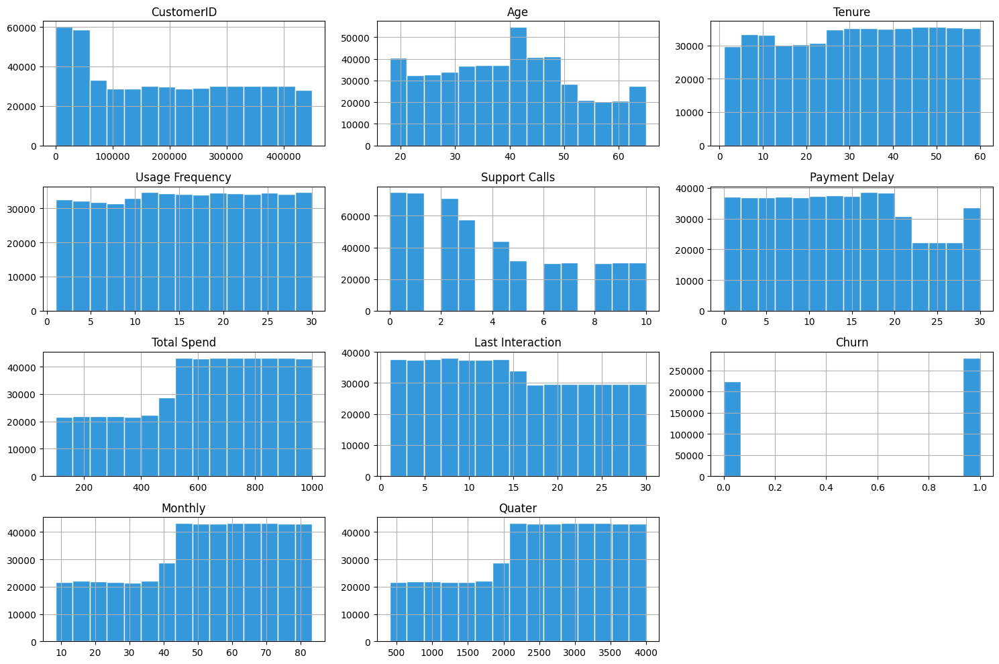

In [16]:
#plot histograms for continuous numeric columns to check distribution
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns
df[numeric_columns].hist(bins=15, figsize=(15, 10), color='#3498DB', edgecolor='#fff')


plt.tight_layout()
plt.show()

Categorical features distribution

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_9292\3570836922.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis', ax=axes[i])
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_9292\3570836922.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis', ax=axes[i])
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_9292\3570836922.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=df, palette='viridis', ax=axes[i])


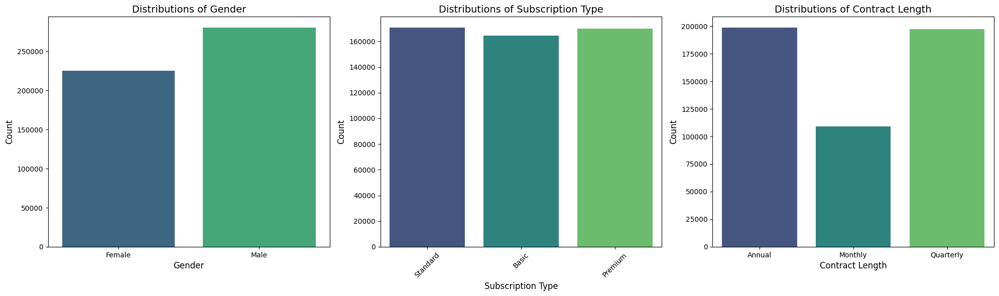

In [17]:
categorical_cols = categorical_columns.columns.tolist()

fig, axes = plt.subplots(1, 3, figsize=(20, 6))
axes = axes.flatten()

for i, col in enumerate(categorical_cols):
    sns.countplot(x=col, data=df, palette='viridis', ax=axes[i])
    axes[i].set_title(f"Distributions of {col}", fontsize=14)
    axes[i].set_xlabel(col, fontsize=12)
    axes[i].set_ylabel('Count', fontsize=12)
    axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

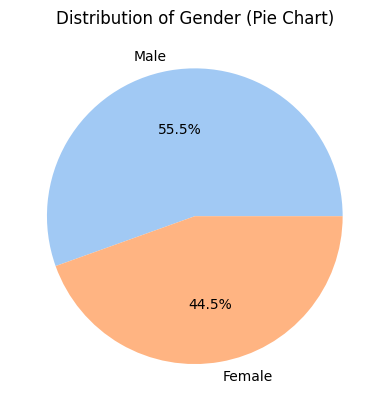

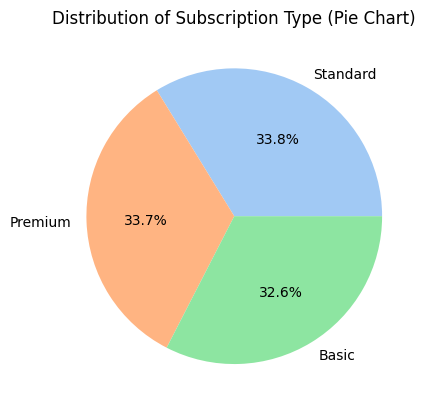

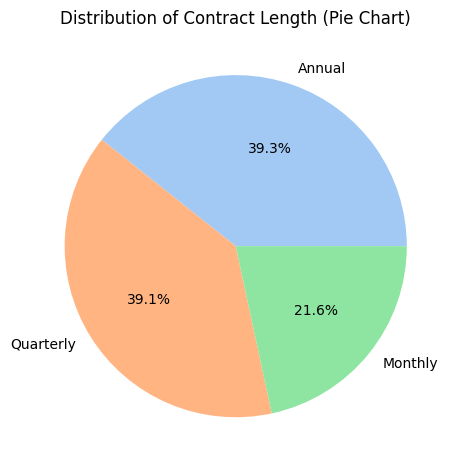

In [18]:
categorical_cols = categorical_columns.columns.to_list()
colors_pie = sns.color_palette('pastel')

for i, col in enumerate(categorical_cols):
    plt.subplots(1, 1)
    counts = df[col].value_counts()
    plt.pie(counts, labels=counts.index, colors=colors_pie, autopct='%1.1f%%')
    plt.title(f"Distribution of {col} (Pie Chart)")
    

plt.tight_layout()
plt.show()

Churn pie distribution

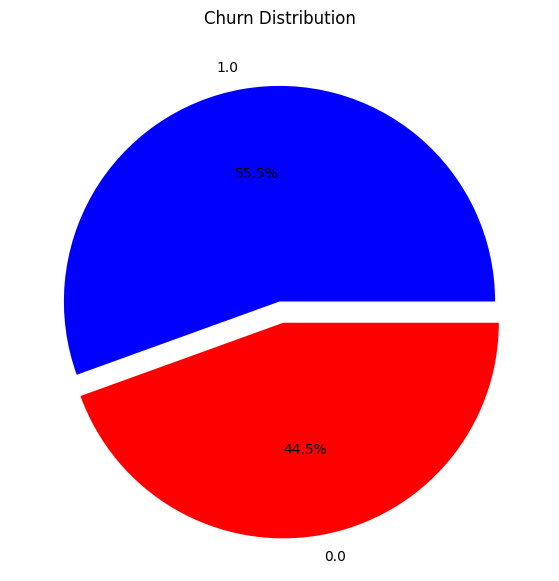

In [19]:
churn_pie_dist = df['Churn'].value_counts()


plt.figure(figsize=(14, 7))
plt.pie(churn_pie_dist, labels=churn_pie_dist.index, autopct='%1.1f%%', colors=['blue', 'red'], explode=(0, 0.1))
plt.title("Churn Distribution")
plt.show()

Bivariate Analysis

churn vs Tenure

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_9292\1759449910.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Churn', y='Tenure', data=df, palette=['#2ECC71', '#E74C3C'])


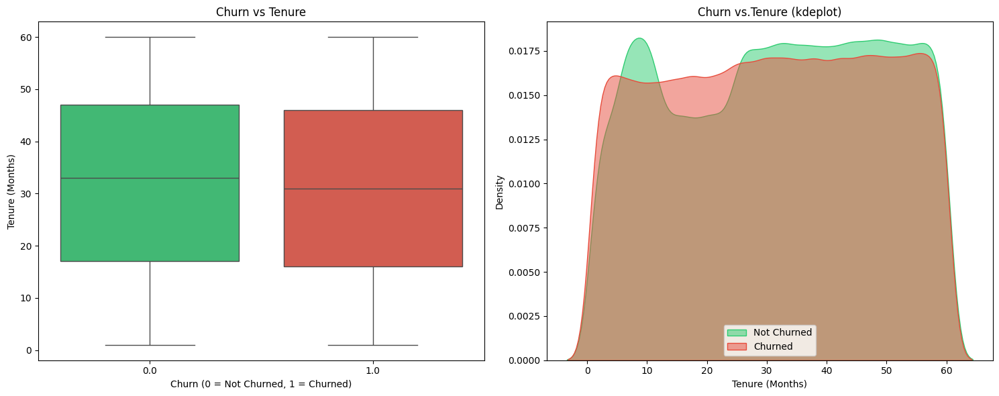

In [20]:
#Churn Vs Tenure Analysis
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x='Churn', y='Tenure', data=df, palette=['#2ECC71', '#E74C3C'])
plt.title('Churn vs Tenure')
plt.xlabel('Churn (0 = Not Churned, 1 = Churned)')
plt.ylabel('Tenure (Months)')

#kde plot
plt.subplot(1, 2, 2)
sns.kdeplot(df[df['Churn'] == 0]['Tenure'], label='Not Churned', fill=True, color='#2ECC71', alpha=0.5)
sns.kdeplot(df[df['Churn'] == 1]['Tenure'], label='Churned', fill=True, color='#E74C3C', alpha=0.5)
plt.title('Churn vs.Tenure (kdeplot)')
plt.xlabel('Tenure (Months)')
plt.ylabel('Density')
plt.legend()

plt.tight_layout()
plt.show()


impact of Support Calls on churn

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_9292\3137849449.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Churn', y='Support Calls', data=df, palette=['#2ECC71', '#E74C3C'])


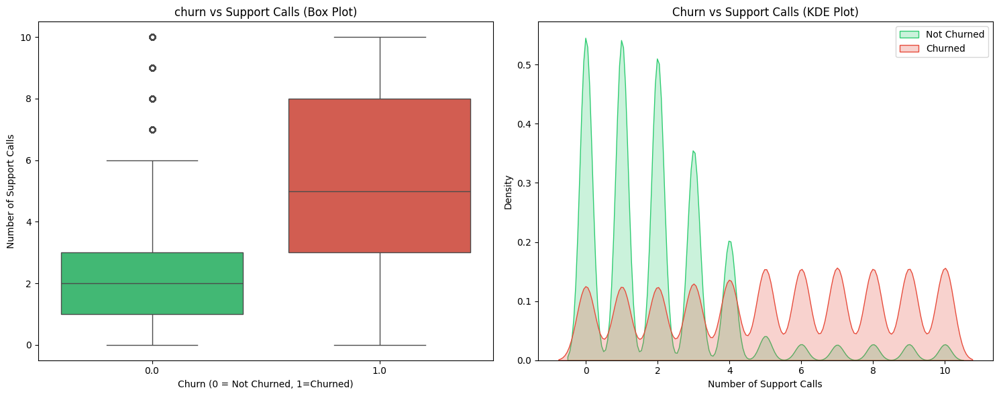

In [21]:
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x='Churn', y='Support Calls', data=df, palette=['#2ECC71', '#E74C3C'])
plt.title('churn vs Support Calls (Box Plot)')
plt.xlabel('Churn (0 = Not Churned, 1=Churned)')
plt.ylabel('Number of Support Calls')

#kdeplot
plt.subplot(1, 2, 2)
sns.kdeplot(df[df['Churn'] == 0]['Support Calls'], label='Not Churned',  fill=True, color='#2ECC71')
sns.kdeplot(df[df['Churn'] == 1]['Support Calls'], label='Churned', fill=True, color='#E74C3C')
plt.title('Churn vs Support Calls (KDE Plot)')
plt.xlabel('Number of Support Calls')
plt.legend()

plt.tight_layout()
plt.show()

Contract Length and Churn Rates

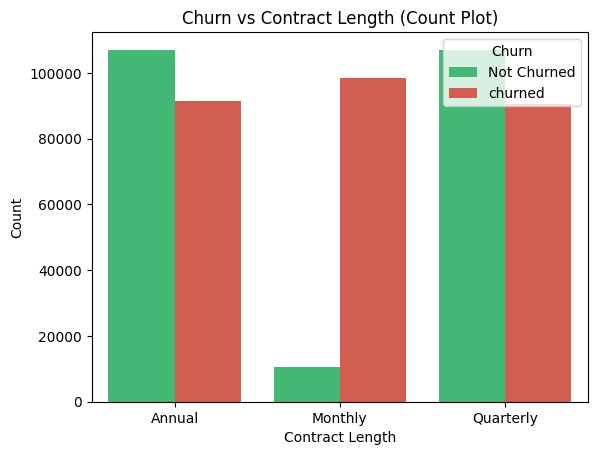

In [23]:
#Churn vs Contract length
sns.countplot(x='Contract Length', hue='Churn', data=df, palette=['#2ECC71', '#E74C3C'])
plt.title('Churn vs Contract Length (Count Plot)')
plt.xlabel('Contract Length')
plt.ylabel('Count')
plt.legend(title='Churn', loc='upper right', labels=['Not Churned', 'churned'])

Statistical Analysis

In [22]:
df.corr(numeric_only=True)

,CustomerID,Age,Tenure,Usage Frequency,Support Calls,Payment Delay,Total Spend,Last Interaction,Churn,Monthly,Quater
CustomerID,1.000000,-0.178442,0.031444,0.043649,-0.476560,-0.282815,0.347573,-0.121668,-0.650617,0.347573,0.347573
Age,-0.178442,1.000000,-0.010078,-0.013551,0.146790,0.060569,-0.078679,0.027472,0.191224,-0.078679,-0.078679
Tenure,0.031444,-0.010078,1.000000,-0.020686,-0.013381,-0.004400,0.015810,-0.004726,-0.021308,0.015810,0.015810
Usage Frequency,0.043649,-0.013551,-0.020686,1.000000,-0.025947,-0.012667,0.019573,-0.006358,-0.053263,0.019573,0.019573
Support Calls,-0.476560,0.146790,-0.013381,-0.025947,1.000000,0.176038,-0.206566,0.074070,0.516283,-0.206566,-0.206566
Payment Delay,-0.282815,0.060569,-0.004400,-0.012667,0.176038,1.000000,-0.125975,0.041767,0.329785,-0.125975,-0.125975
Total Spend,0.347573,-0.078679,0.015810,0.019573,-0.206566,-0.125975,1.000000,-0.054560,-0.369682,1.000000,1.000000
Last Interaction,-0.121668,0.027472,-0.004726,-0.006358,0.074070,0.041767,-0.054560,1.000000,0.127150,-0.054560,-0.054560
Churn,-0.650617,0.191224,-0.021308,-0.053263,0.516283,0.329785,-0.369682,0.127150,1.000000,-0.369682,-0.369682
Monthly,0.347573,-0.078679,0.015810,0.019573,-0.206566,-0.125975,1.000000,-0.054560,-0.369682,1.000000,1.000000


In [24]:
corre_matrix = df.select_dtypes(include=[np.number])
corr_matrix = corre_matrix.corr()

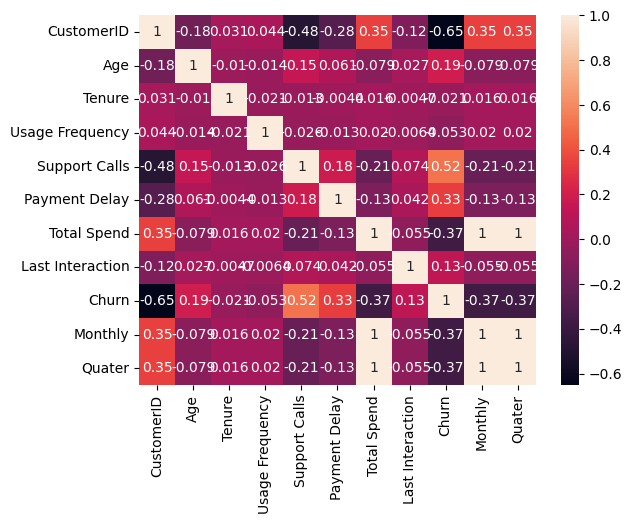

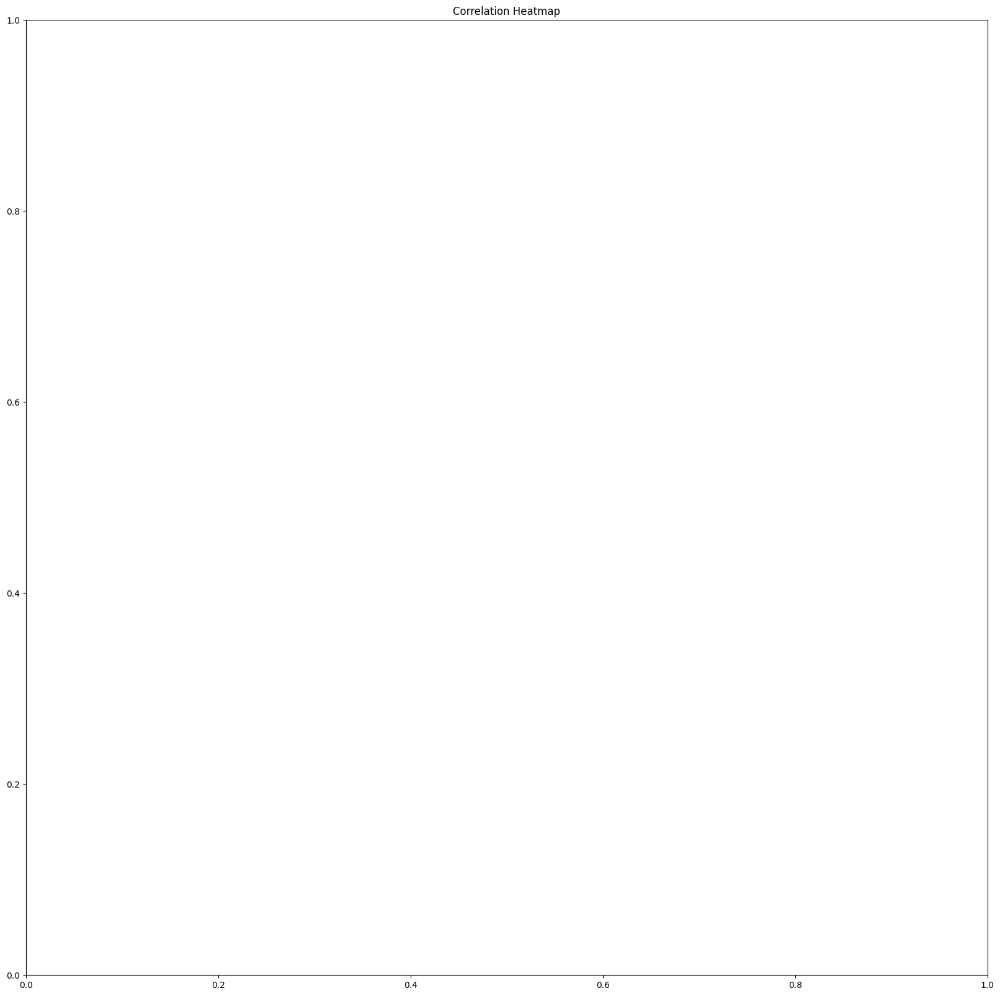

In [25]:
sns.heatmap(corr_matrix, annot=True, )
plt.figure(figsize=(20, 20))
plt.title('Correlation Heatmap')
plt.show()

In [26]:
df.describe()

,CustomerID,Age,Tenure,Usage Frequency,Support Calls,Payment Delay,Total Spend,Last Interaction,Churn,Monthly,Quater
count,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000
mean,200779.451782,39.704172,31.350435,15.714825,3.833317,13.496843,620.072766,14.610581,0.555203,51.672730,2480.291063
std,137241.343095,12.670577,17.237482,8.619323,3.133603,8.451187,245.319256,8.608286,0.496944,20.443271,981.277022
min,1.000000,18.000000,1.000000,1.000000,0.000000,0.000000,100.000000,1.000000,0.000000,8.333333,400.000000
25%,63827.250000,29.000000,16.000000,8.000000,1.000000,6.000000,446.000000,7.000000,0.000000,37.166667,1784.000000
50%,193039.500000,40.000000,32.000000,16.000000,3.000000,13.000000,648.900000,14.000000,1.000000,54.075000,2595.600000
75%,321645.750000,49.000000,46.000000,23.000000,6.000000,20.000000,824.000000,22.000000,1.000000,68.666667,3296.000000
max,449999.000000,65.000000,60.000000,30.000000,10.000000,30.000000,1000.000000,30.000000,1.000000,83.333333,4000.000000


Logistic Regression

1.Customer Demographicss

In [27]:
df.columns

Index(['CustomerID', 'Age', 'Gender', 'Tenure', 'Usage Frequency',
       'Support Calls', 'Payment Delay', 'Subscription Type',
       'Contract Length', 'Total Spend', 'Last Interaction', 'Churn',
       'Monthly', 'Quater'],
      dtype='object')

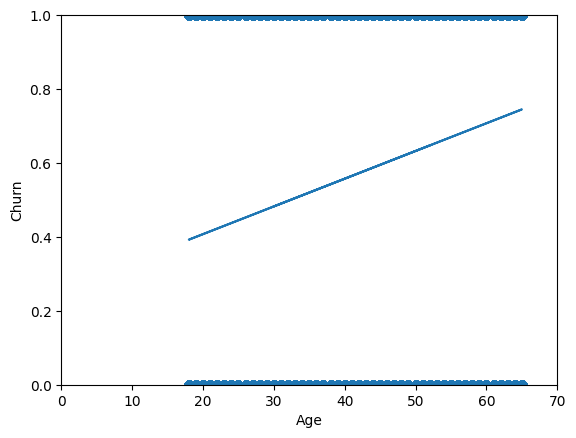

In [28]:
x = df['Age']
y = df['Churn']

slope, intercept, r, p, std_err = stats.linregress(x, y)

def myfunc(x):
    return slope * x + intercept

mymodel = list(map(myfunc, x))

plt.scatter(x, y)
plt.plot(x, slope * x + intercept)
plt.ylim(ymin=0, ymax=1)
plt.xlim(xmin= 0, xmax=70)
plt.xlabel('Age')
plt.ylabel('Churn')
plt.show()

Regresion Table

In [29]:
model = smf.ols('Churn ~ Age', data=df)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                  Churn   R-squared:                       0.037
Model:                            OLS   Adj. R-squared:                  0.037
Method:                 Least Squares   F-statistic:                 1.917e+04
Date:                Fri, 06 Feb 2026   Prob (F-statistic):               0.00
Time:                        14:42:24   Log-Likelihood:            -3.5417e+05
No. Observations:              505206   AIC:                         7.083e+05
Df Residuals:                  505204   BIC:                         7.084e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.2574      0.002    114.044      0.0

In [30]:
def predict_churn(Age):
    return(0.0075 * Age + 0.2574)
print(predict_churn(65))
print(predict_churn(60))
print(predict_churn(50))
print(predict_churn(40))
print(predict_churn(30))

0.7449
0.7074
0.6324000000000001
0.5574
0.4824


In [31]:
df.columns

Index(['CustomerID', 'Age', 'Gender', 'Tenure', 'Usage Frequency',
       'Support Calls', 'Payment Delay', 'Subscription Type',
       'Contract Length', 'Total Spend', 'Last Interaction', 'Churn',
       'Monthly', 'Quater'],
      dtype='object')

In [32]:
df.describe()

,CustomerID,Age,Tenure,Usage Frequency,Support Calls,Payment Delay,Total Spend,Last Interaction,Churn,Monthly,Quater
count,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000
mean,200779.451782,39.704172,31.350435,15.714825,3.833317,13.496843,620.072766,14.610581,0.555203,51.672730,2480.291063
std,137241.343095,12.670577,17.237482,8.619323,3.133603,8.451187,245.319256,8.608286,0.496944,20.443271,981.277022
min,1.000000,18.000000,1.000000,1.000000,0.000000,0.000000,100.000000,1.000000,0.000000,8.333333,400.000000
25%,63827.250000,29.000000,16.000000,8.000000,1.000000,6.000000,446.000000,7.000000,0.000000,37.166667,1784.000000
50%,193039.500000,40.000000,32.000000,16.000000,3.000000,13.000000,648.900000,14.000000,1.000000,54.075000,2595.600000
75%,321645.750000,49.000000,46.000000,23.000000,6.000000,20.000000,824.000000,22.000000,1.000000,68.666667,3296.000000
max,449999.000000,65.000000,60.000000,30.000000,10.000000,30.000000,1000.000000,30.000000,1.000000,83.333333,4000.000000


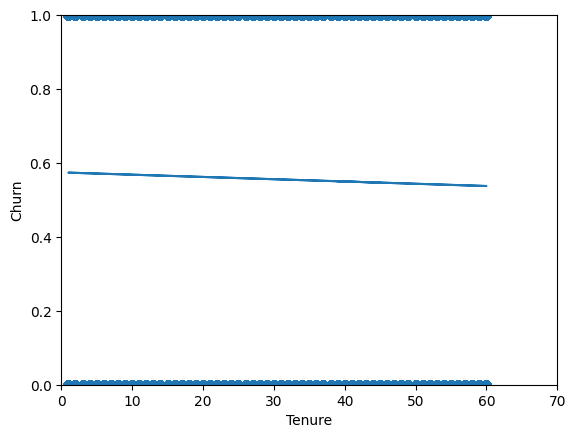

In [33]:
x = df['Tenure']
y = df['Churn']

slope, intercept, r, p, std_err = stats.linregress(x, y)

def myfunc(x):
    return slope * x + intercept

mymodel = list(map(myfunc, x))
plt.scatter(x, y)
plt.plot(x, slope * x + intercept)
plt.ylim(ymin=0, ymax=1)
plt.xlim(xmin=0, xmax=70)
plt.ylabel('Churn')
plt.xlabel('Tenure')
plt.show()


In [34]:
model = smf.ols('Churn ~ Tenure', data=df)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                  Churn   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     229.5
Date:                Fri, 06 Feb 2026   Prob (F-statistic):           7.95e-52
Time:                        14:42:49   Log-Likelihood:            -3.6346e+05
No. Observations:              505206   AIC:                         7.269e+05
Df Residuals:                  505204   BIC:                         7.269e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.5745      0.001    395.966      0.0

In [35]:
def predict_churn(Tenure):
    return(-0.0006 * Tenure + 0.5745)
print(predict_churn(60))
print(predict_churn(31.350435))
print(predict_churn(32))
print(predict_churn(46))
print(predict_churn(16))
print(predict_churn(1))

0.5385
0.555689739
0.5553
0.5469
0.5649
0.5739


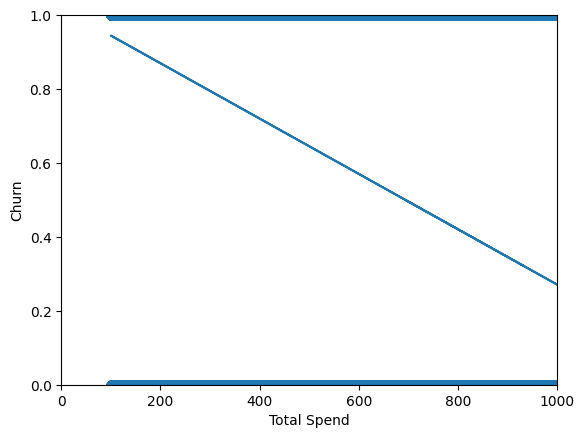

In [36]:
x = df['Total Spend']
y = df['Churn']

slope, intercept, r, p, std_err = stats.linregress(x, y)

def total_spend(x):
    return slope * x + intercept
mymodel = list(map(total_spend, x))
plt.scatter(x, y)
plt.plot(x, slope * x + intercept)
plt.ylim(ymin=0, ymax=1)
plt.xlim(xmin=0, xmax=1000)
plt.ylabel('Churn')
plt.xlabel('Total Spend')
plt.show()

In [36]:
total_spend = df['Total Spend']
model = smf.ols('Churn ~ total_spend', data=df)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                  Churn   R-squared:                       0.137
Model:                            OLS   Adj. R-squared:                  0.137
Method:                 Least Squares   F-statistic:                 7.997e+04
Date:                Fri, 06 Feb 2026   Prob (F-statistic):               0.00
Time:                        13:43:38   Log-Likelihood:            -3.2646e+05
No. Observations:              505206   AIC:                         6.529e+05
Df Residuals:                  505204   BIC:                         6.529e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       1.0196      0.002    577.376      

In [37]:
def predict_churn(total_spend):
    return(-0.0007  * total_spend + 1.0196)
print(predict_churn(1000))
print(predict_churn(30))
print(predict_churn(20))
print(predict_churn(200))

0.3196000000000001
0.9986
1.0056
0.8796


In [38]:
df.columns

Index(['CustomerID', 'Age', 'Gender', 'Tenure', 'Usage Frequency',
       'Support Calls', 'Payment Delay', 'Subscription Type',
       'Contract Length', 'Total Spend', 'Last Interaction', 'Churn',
       'Monthly', 'Quater'],
      dtype='object')

In [39]:
df.describe()

,CustomerID,Age,Tenure,Usage Frequency,Support Calls,Payment Delay,Total Spend,Last Interaction,Churn,Monthly,Quater
count,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000
mean,200779.451782,39.704172,31.350435,15.714825,3.833317,13.496843,620.072766,14.610581,0.555203,51.672730,2480.291063
std,137241.343095,12.670577,17.237482,8.619323,3.133603,8.451187,245.319256,8.608286,0.496944,20.443271,981.277022
min,1.000000,18.000000,1.000000,1.000000,0.000000,0.000000,100.000000,1.000000,0.000000,8.333333,400.000000
25%,63827.250000,29.000000,16.000000,8.000000,1.000000,6.000000,446.000000,7.000000,0.000000,37.166667,1784.000000
50%,193039.500000,40.000000,32.000000,16.000000,3.000000,13.000000,648.900000,14.000000,1.000000,54.075000,2595.600000
75%,321645.750000,49.000000,46.000000,23.000000,6.000000,20.000000,824.000000,22.000000,1.000000,68.666667,3296.000000
max,449999.000000,65.000000,60.000000,30.000000,10.000000,30.000000,1000.000000,30.000000,1.000000,83.333333,4000.000000


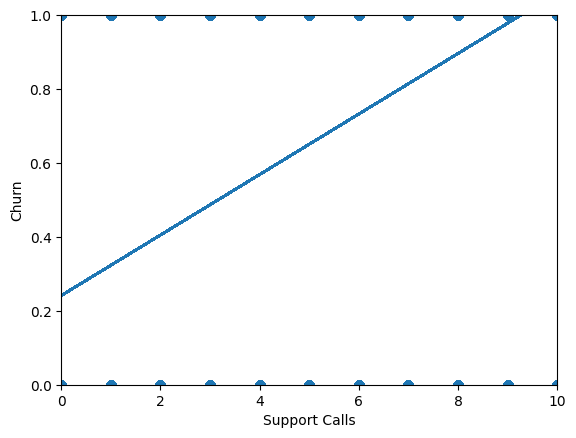

In [40]:
x = df['Support Calls']
y = df['Churn']

slope, intercept, r, p, std_err = stats.linregress(x, y)

def myfunc(x):
    return slope * x +intercept
mymodel = list(map(myfunc, x))

plt.scatter(x, y)
plt.plot(x, slope * x + intercept)
plt.ylim(ymin=0, ymax=1)
plt.xlim(xmin=0, xmax=10)
plt.ylabel('Churn')
plt.xlabel('Support Calls')
plt.show()



In [41]:
Support_calls = df['Support Calls']
model = smf.ols('Churn ~ Support_calls', data=df)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                  Churn   R-squared:                       0.267
Model:                            OLS   Adj. R-squared:                  0.267
Method:                 Least Squares   F-statistic:                 1.836e+05
Date:                Sat, 07 Feb 2026   Prob (F-statistic):               0.00
Time:                        00:31:12   Log-Likelihood:            -2.8527e+05
No. Observations:              505206   AIC:                         5.705e+05
Df Residuals:                  505204   BIC:                         5.706e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         0.2414      0.001    255.110

In [48]:
def predict_churn(Support_calls):
    return(0.0819 * Support_calls + 0.2414)
print(predict_churn(10))
print(predict_churn(9))
print(predict_churn(8))
print(predict_churn(11))
print(predict_churn(12))
print(predict_churn(7))
print(predict_churn(6))

1.0604
0.9784999999999999
0.8966000000000001
1.1423
1.2242
0.8147
0.7328


In [49]:
df.columns

Index(['CustomerID', 'Age', 'Gender', 'Tenure', 'Usage Frequency',
       'Support Calls', 'Payment Delay', 'Subscription Type',
       'Contract Length', 'Total Spend', 'Last Interaction', 'Churn',
       'Monthly', 'Quater'],
      dtype='object')

[np.float64(0.6425279860497632), np.float64(0.4486090097925812), np.float64(0.6425279860497632), np.float64(0.42921711216686304), np.float64(0.4486090097925812), np.float64(0.7976631670555089), np.float64(0.6037441907983269), np.float64(0.5843522931726086), np.float64(0.3710414192897084), np.float64(0.5067847026697359), np.float64(0.8752307575583818), np.float64(0.7976631670555089), np.float64(0.7782712694297906), np.float64(0.5455684979211722), np.float64(0.7200955765526361), np.float64(0.8752307575583818), np.float64(0.5067847026697359), np.float64(0.3904333169154266), np.float64(0.3710414192897084), np.float64(0.5649603955468905), np.float64(0.3516495216639902), np.float64(0.5843522931726086), np.float64(0.6425279860497632), np.float64(0.3516495216639902), np.float64(0.4873928050440176), np.float64(0.7200955765526361), np.float64(0.8364469623069454), np.float64(0.3904333169154266), np.float64(0.33225762403827197), np.float64(0.40982521454114484), np.float64(0.8170550646812271), np.f

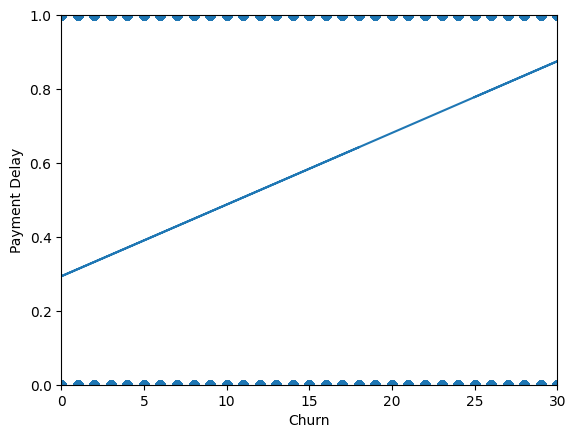

In [ ]:
x = df['Payment Delay']
y = df['Churn']

slope, intercept, r, p, std_err = stats.linregress(x, y)

def myfunc(x):
    return slope * x + intercept
mymodel = list(map(myfunc, x))


plt.scatter(x, y)
plt.plot(x, slope * x + intercept)
plt.ylim(ymin=0, ymax=1)
plt.xlim(xmin=0, xmax=30)
plt.ylabel('Payment Delay')
plt.xlabel('Churn')
plt.show()



In [53]:
payment_delay = df['Payment Delay']
model = smf.ols('Churn ~ payment_delay', data=df)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                  Churn   R-squared:                       0.109
Model:                            OLS   Adj. R-squared:                  0.109
Method:                 Least Squares   F-statistic:                 6.165e+04
Date:                Sat, 07 Feb 2026   Prob (F-statistic):               0.00
Time:                        01:32:53   Log-Likelihood:            -3.3449e+05
No. Observations:              505206   AIC:                         6.690e+05
Df Residuals:                  505204   BIC:                         6.690e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         0.2935      0.001    235.967

In [54]:
def predict_churn(payment_delay):
    return(0.0194 * payment_delay + 0.2935)
print(predict_churn(30))

0.8755000000000001


In [55]:
df.columns

Index(['CustomerID', 'Age', 'Gender', 'Tenure', 'Usage Frequency',
       'Support Calls', 'Payment Delay', 'Subscription Type',
       'Contract Length', 'Total Spend', 'Last Interaction', 'Churn',
       'Monthly', 'Quater'],
      dtype='object')

In [56]:
df.describe()

,CustomerID,Age,Tenure,Usage Frequency,Support Calls,Payment Delay,Total Spend,Last Interaction,Churn,Monthly,Quater
count,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000,505206.000000
mean,200779.451782,39.704172,31.350435,15.714825,3.833317,13.496843,620.072766,14.610581,0.555203,51.672730,2480.291063
std,137241.343095,12.670577,17.237482,8.619323,3.133603,8.451187,245.319256,8.608286,0.496944,20.443271,981.277022
min,1.000000,18.000000,1.000000,1.000000,0.000000,0.000000,100.000000,1.000000,0.000000,8.333333,400.000000
25%,63827.250000,29.000000,16.000000,8.000000,1.000000,6.000000,446.000000,7.000000,0.000000,37.166667,1784.000000
50%,193039.500000,40.000000,32.000000,16.000000,3.000000,13.000000,648.900000,14.000000,1.000000,54.075000,2595.600000
75%,321645.750000,49.000000,46.000000,23.000000,6.000000,20.000000,824.000000,22.000000,1.000000,68.666667,3296.000000
max,449999.000000,65.000000,60.000000,30.000000,10.000000,30.000000,1000.000000,30.000000,1.000000,83.333333,4000.000000


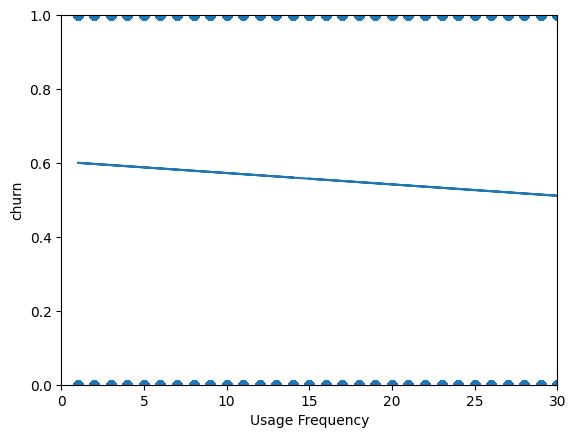

In [57]:
x = df['Usage Frequency']
y = df['Churn']

slope, intercept, r, p, std_err = stats.linregress(x, y)

def myfunc(x):
    return slope * x + intercept
mymodel = list(map(myfunc, x))

plt.scatter(x, y)
plt.plot(x, slope * x + intercept)
plt.ylim(ymin=0, ymax=1)
plt.xlim(xmin=0, xmax=30)
plt.ylabel('churn')
plt.xlabel('Usage Frequency')
plt.show()

In [58]:
usage_frequency = df['Usage Frequency']
model = smf.ols('Churn ~ usage_frequency', data=df)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                  Churn   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     1437.
Date:                Sat, 07 Feb 2026   Prob (F-statistic):               0.00
Time:                        01:50:29   Log-Likelihood:            -3.6286e+05
No. Observations:              505206   AIC:                         7.257e+05
Df Residuals:                  505204   BIC:                         7.257e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept           0.6035      0.001    4

In [60]:
def predict_churn(usage_frequency):
    return(-0.0031 * usage_frequency + 0.6035)
print(predict_churn(30))
print(predict_churn(5))

0.5105000000000001
0.5880000000000001
